# Исследование объявлений о продаже квартир в Санкт-Петербурге

## Цели
Исследовать обьявления о продаже квартир

## Задачи
Изучить особенности продаваемых квартир:  
 - высота потолков,
 - площади общую, жилую и кухонную,
 - количество комнат,
 - стоимость квартир,
 - этаж,
 - близость парков.  

Исследовать зависимость стоимости квартиры от    
 - общей и жилой площади,   
 - площади кухни,  
 - расположения квартиры отностельно типа этажа(первый, последний, другой),  
 - удаленности от центра Петербурга,   
 - количеством комнат,    
 - времени публикации обьявления (дня недели, месяца,года),  
 - скорость продажи квартир и 
 - среднюю стоимость 1м2 в 10 населенных пунктах с наибольшим числом обьявлений.

## Описание данных



`airports_nearest` — расстояние до ближайшего аэропорта в метрах (м)  
`balcony` — число балконов  
`ceiling_height` — высота потолков (м)  
`cityCenters_nearest` — расстояние до центра города (м)  
`days_exposition` — сколько дней было размещено объявление (от публикации до снятия)  
`first_day_exposition` — дата публикации  
`floor` — этаж  
`floors_total` — всего этажей в доме  
`is_apartment` — апартаменты (булев тип)  
`kitchen_area` — площадь кухни в квадратных метрах (м²)  
`last_price` — цена на момент снятия с публикации  
`living_area` — жилая площадь в квадратных метрах (м²)  
`locality_name` — название населённого пункта  
`open_plan` — свободная планировка (булев тип)  
`parks_around3000` — число парков в радиусе 3 км  
`parks_nearest` — расстояние до ближайшего парка (м)  
`ponds_around3000` — число водоёмов в радиусе 3 км  
`ponds_nearest` — расстояние до ближайшего водоёма (м)  
`rooms` — число комнат  
`studio` — квартира-студия (булев тип)  
`total_area` — общая площадь квартиры в квадратных метрах (м²)  
`total_images` — число фотографий квартиры в объявлении  


In [195]:
import pandas as pd
import plotly.express as px
import warnings
warnings.filterwarnings('ignore')

from plotly.offline import plot, iplot, init_notebook_mode
init_notebook_mode(connected=True)

import plotly.io as pio


In [196]:

data = pd.read_csv(
        'https://code.s3.yandex.net/datasets/real_estate_data.csv', sep='\t')

Построим гистограммы для всех числовых столбцов таблицы, для ознакомдения с чиловыми данными

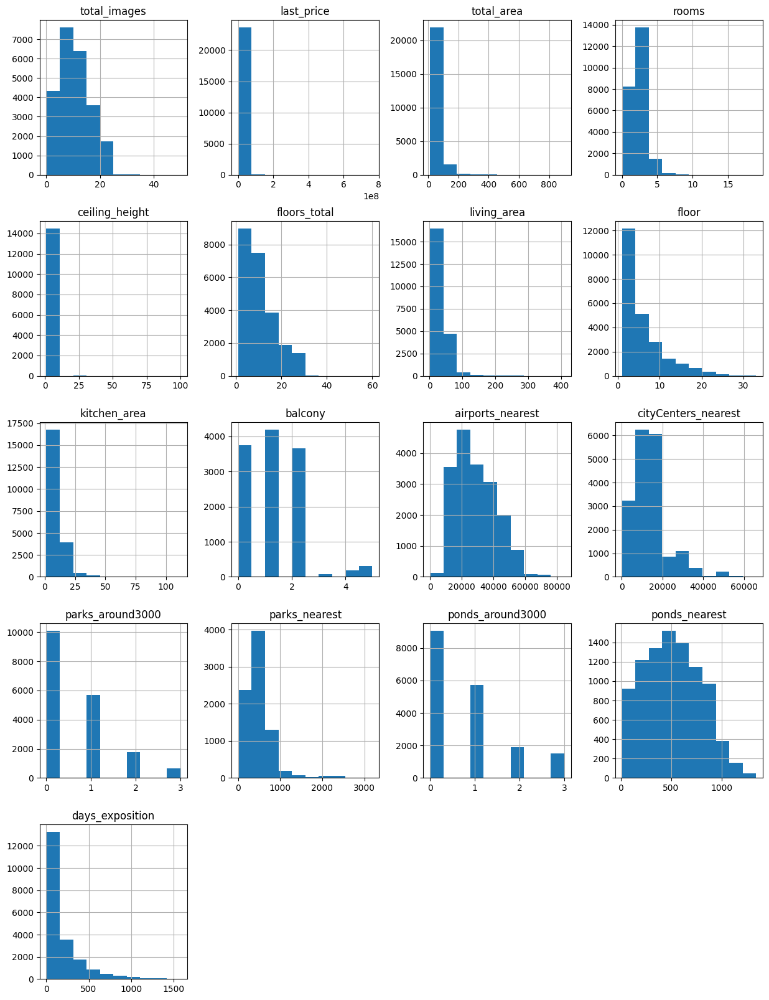

In [197]:
data.hist(figsize=(15, 20));

## Предобработка данных

приведем в порядок названия столбцов

In [198]:
data = data.rename(columns={'cityCenters_nearest': 'city_centers_nearest',
                            'parks_around3000': 'parks_around_3000',
                            'ponds_around3000': 'ponds_around_3000'})
# проверим
for i in data.columns.sort_values():
    print(i)

airports_nearest
balcony
ceiling_height
city_centers_nearest
days_exposition
first_day_exposition
floor
floors_total
is_apartment
kitchen_area
last_price
living_area
locality_name
open_plan
parks_around_3000
parks_nearest
ponds_around_3000
ponds_nearest
rooms
studio
total_area
total_images


При помощи самодельной функции ознакомимся с общей информацией о таблице

In [199]:
def get_info_dataframe(dataframe,
                       transpose=False,
                       count_rows=5
                       ):
    """
    получение основной информации о датафрейме  
    `dataframe` - исследуемый датафрейм   
    `transpose` - перевернуть таблицу на 90°    
    `count_rows` - чило выводимых строк
    """

    # -----------------сбока таблицы с пропусками---------------------
    # число пропусков
    count_missing = dataframe.isna().sum()
    # доля пропусков
    missing_percent = count_missing/len(dataframe)*100

    # сборка
    df = pd.DataFrame(data={'missing_percent': missing_percent,
                            'count_missing': count_missing
                            })
    # цветной бар в столбце с долей пропусков и добапвляем знак %
    table = (df
             .style
             .bar(subset="missing_percent",
                  vmax=100,
                  color='red')
             .format(subset="missing_percent",
                     formatter="{:.2f} %"
                     ))
    # --------------------------------------

    # сводная информация
    print(dataframe.info())

    # часть таблицы
    if transpose == True:
        display(dataframe.head(count_rows).T)
    else:
        display(dataframe.head(count_rows))

    # число дубликатов
    print(
        f'\nявных дубликатов: {dataframe.duplicated().sum()}\n{". "*10}'.upper())

    # число пропусков
    print(f'\nпропуски'.upper())
    display(table)

    print('----'*20)

In [200]:
get_info_dataframe(data, transpose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 23699 entries, 0 to 23698
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   total_images          23699 non-null  int64  
 1   last_price            23699 non-null  float64
 2   total_area            23699 non-null  float64
 3   first_day_exposition  23699 non-null  object 
 4   rooms                 23699 non-null  int64  
 5   ceiling_height        14504 non-null  float64
 6   floors_total          23613 non-null  float64
 7   living_area           21796 non-null  float64
 8   floor                 23699 non-null  int64  
 9   is_apartment          2775 non-null   object 
 10  studio                23699 non-null  bool   
 11  open_plan             23699 non-null  bool   
 12  kitchen_area          21421 non-null  float64
 13  balcony               12180 non-null  float64
 14  locality_name         23650 non-null  object 
 15  airports_nearest   

,0,1,2,3,4
total_images,20,7,10,0,2
last_price,13000000.0,3350000.0,5196000.0,64900000.0,10000000.0
total_area,108.0,40.4,56.0,159.0,100.0
first_day_exposition,2019-03-07T00:00:00,2018-12-04T00:00:00,2015-08-20T00:00:00,2015-07-24T00:00:00,2018-06-19T00:00:00
rooms,3,1,2,3,2
ceiling_height,2.7,NaN,NaN,NaN,3.03
floors_total,16.0,11.0,5.0,14.0,14.0
living_area,51.0,18.6,34.3,NaN,32.0
floor,8,1,4,9,13
is_apartment,NaN,NaN,NaN,NaN,NaN



ЯВНЫХ ДУБЛИКАТОВ: 0
. . . . . . . . . . 

ПРОПУСКИ


,missing_percent,count_missing
total_images,0.00 %,0
last_price,0.00 %,0
total_area,0.00 %,0
first_day_exposition,0.00 %,0
rooms,0.00 %,0
ceiling_height,38.80 %,9195
floors_total,0.36 %,86
living_area,8.03 %,1903
floor,0.00 %,0
is_apartment,88.29 %,20924


--------------------------------------------------------------------------------


### Устранение пропусков

Заполним пропуски там, где это возможно.  
Если не указали число балконов то скорее всего их там нет - укажем как 0.  
Если не указали is_apartment (апартаменты) - то примем за False.  
С количеством водоемов и парков в радиусе 3000 м поступим также -только  вместо пропусков - 0 -как бы их нет.

In [201]:
# заменяем пропуски на 0 и False
data['balcony'] = data['balcony'].fillna(0)
data['is_apartment'] = data['is_apartment'].fillna(False)

пропуски в living_area заменим средним отношением жилой площади к общей и умножим на общую площадь. С kithen_area поступим также.

In [202]:
# середний коэффицент отношения жилой/кухонной площади к обшей площади
share_living_total = round((data['living_area']/data['total_area']).mean(), 2)

share_kitchen_total = round((data['kitchen_area'] /
                             data['total_area'])
                            .mean(), 2)

заполним пропуски

In [203]:
data['living_area'] = (data['living_area']
                       .fillna(share_living_total * data['total_area']))


data['kitchen_area'] = (data['kitchen_area']
                        .fillna(share_kitchen_total * data['total_area']
                                ))

Пропуски в ceiling_height заменим медианным значением

In [204]:
data['ceiling_height'] = (data['ceiling_height']
                          .fillna(
                              data['ceiling_height'].median()
)
)

проверим

In [205]:
data.isna().sum().sort_values(ascending=False)

parks_nearest           15620
ponds_nearest           14589
airports_nearest         5542
city_centers_nearest     5519
ponds_around_3000        5518
parks_around_3000        5518
days_exposition          3181
floors_total               86
locality_name              49
kitchen_area                0
balcony                     0
total_images                0
last_price                  0
studio                      0
is_apartment                0
floor                       0
living_area                 0
ceiling_height              0
rooms                       0
first_day_exposition        0
total_area                  0
open_plan                   0
dtype: int64

Пропуски заполнены.

### Причины пропусков


Больше пропусков в столбцах, заполняемых автоматически(более 5000 на столбец) - это техническая сторона пропусков.  
Остальные пропуски относятся к человескому факотору, но их заметно меньше.


## Изменение типов данных


Найдем столбцы где необходимо изменить типы данных

In [206]:
data.dtypes

total_images              int64
last_price              float64
total_area              float64
first_day_exposition     object
rooms                     int64
ceiling_height          float64
floors_total            float64
living_area             float64
floor                     int64
is_apartment               bool
studio                     bool
open_plan                  bool
kitchen_area            float64
balcony                 float64
locality_name            object
airports_nearest        float64
city_centers_nearest    float64
parks_around_3000       float64
parks_nearest           float64
ponds_around_3000       float64
ponds_nearest           float64
days_exposition         float64
dtype: object

*изменить тип следует в*  **( столбец -> в верный тип )**  
airports_nearest -> int  
balcony -> int  
city_centers_nearest -> int  
days_exposition -> int   
floors_total -> int  
last_price -> int  
parks_around_3000 -> int  
parks_nearest -> int  
ponds_around_3000 -> int  
ponds_nearest -> int  

first_day_exposition -> datetime 

Посмотрим что с датой

In [207]:
data['first_day_exposition'].head(20)

0     2019-03-07T00:00:00
1     2018-12-04T00:00:00
2     2015-08-20T00:00:00
3     2015-07-24T00:00:00
4     2018-06-19T00:00:00
5     2018-09-10T00:00:00
6     2017-11-02T00:00:00
7     2019-04-18T00:00:00
8     2018-05-23T00:00:00
9     2017-02-26T00:00:00
10    2017-11-16T00:00:00
11    2018-08-27T00:00:00
12    2016-06-30T00:00:00
13    2017-07-01T00:00:00
14    2016-06-23T00:00:00
15    2017-11-18T00:00:00
16    2017-11-23T00:00:00
17    2016-09-09T00:00:00
18    2017-01-27T00:00:00
19    2019-01-09T00:00:00
Name: first_day_exposition, dtype: object

Отбросим время, оно не играет роли.

Изменим тип данных. Для  подавляющей части применим цикл.   


In [208]:
list_columns = ['airports_nearest',
                'balcony',
                'city_centers_nearest',
                'days_exposition',
                'floors_total',
                'last_price',
                'parks_around_3000',
                'parks_nearest',
                'ponds_around_3000',
                'ponds_nearest']

# тут с флоат на инт
for col in list_columns:

    data[col] = data[col].astype(dtype='int', errors='ignore')

# тут - для даты ---> год-месяц-день
data['first_day_exposition'] = (pd.to_datetime(data['first_day_exposition'],
                                               format='%Y-%m-%dT%H:%M:%S'
                                               )
                                )


# проверяем
data.dtypes

total_images                     int64
last_price                       int32
total_area                     float64
first_day_exposition    datetime64[ns]
rooms                            int64
ceiling_height                 float64
floors_total                   float64
living_area                    float64
floor                            int64
is_apartment                      bool
studio                            bool
open_plan                         bool
kitchen_area                   float64
balcony                          int32
locality_name                   object
airports_nearest               float64
city_centers_nearest           float64
parks_around_3000              float64
parks_nearest                  float64
ponds_around_3000              float64
ponds_nearest                  float64
days_exposition                float64
dtype: object

Цель замены типа данных    
Привести тип данных к истинно верному(число балконов может быть только целым) и устранить вещественную часть, которая не сыграет роли в вычислениях.

## Устранение неявных дубликатов

Изучим уникальные значения в столбце с названиями населенных пунктов на наличие неявных дубликатов

In [209]:
data['locality_name'].unique()[:80]

array(['Санкт-Петербург', 'посёлок Шушары', 'городской посёлок Янино-1',
       'посёлок Парголово', 'посёлок Мурино', 'Ломоносов', 'Сертолово',
       'Петергоф', 'Пушкин', 'деревня Кудрово', 'Коммунар', 'Колпино',
       'поселок городского типа Красный Бор', 'Гатчина', 'поселок Мурино',
       'деревня Фёдоровское', 'Выборг', 'Кронштадт', 'Кировск',
       'деревня Новое Девяткино', 'посёлок Металлострой',
       'посёлок городского типа Лебяжье',
       'посёлок городского типа Сиверский', 'поселок Молодцово',
       'поселок городского типа Кузьмоловский',
       'садовое товарищество Новая Ропша', 'Павловск',
       'деревня Пикколово', 'Всеволожск', 'Волхов', 'Кингисепп',
       'Приозерск', 'Сестрорецк', 'деревня Куттузи', 'посёлок Аннино',
       'поселок городского типа Ефимовский', 'посёлок Плодовое',
       'деревня Заклинье', 'поселок Торковичи', 'поселок Первомайское',
       'Красное Село', 'посёлок Понтонный', 'Сясьстрой', 'деревня Старая',
       'деревня Лесколово', '

Видно много, но хочется конкретики. Напишем функции для получения уникальных типов населенных пунктов

In [210]:
# функция отсекающая тип населенного пункта и возвращает его
def func_return_type(arg):
    try:
        for j in range(len(arg)):
            if arg[j] != arg[j].lower():
                return arg[: arg.index(arg[j])]
    except:
        return arg

# функция возвращающая уникальные типы населенных пунктов


def proverka_type(arg):
    unique_type_locality_name = []
    for i in arg.unique():
        unique_type_locality_name.append(func_return_type(i))

    unique = list(set(unique_type_locality_name))
    for type_name in unique:
        print(type_name)

Выведем на экран типы нас.пунктов существующих в таблице

In [211]:
proverka_type(data['locality_name'])


nan
посёлок городского типа имени 
поселок городского типа имени 
село 
поселок станции 
деревня 
городской поселок 
посёлок станции 
городской посёлок 
садоводческое некоммерческое товарищество 
посёлок 
посёлок при железнодорожной станции 
поселок 
садовое товарищество 
посёлок городского типа 
поселок городского типа 
коттеджный поселок 
коттеджный посёлок 


Уже интересно. nan- это города - там тип не указан. Заменим Ё на Е, все типы поселков сделаем просто **поселками/ поселками имени** и разберемся с садоводами. Так точно избавимся от неявных дубликатов в топонимах.

In [212]:
# заменяем Ё на Е и затем просто стираем все лишнее, заменив на НИЧЕГО, оставляя ПОСЕЛОК / ПОСЕЛОК ИМЕНИ
# и отдельно разбираемся с садоводами
data['locality_name'] = (
    data['locality_name']
    .str.replace('ё', 'е')
    .replace(['городского типа ',
              'коттеджный ',
              'при железнодорожной станции ',
              'станции ',
              'городской ',], '', regex=True)
    .replace(['садоводческое некоммерческое'], 'садовое', regex=True)
)


def func_return_type(arg):
    try:
        for j in range(len(arg)):
            if arg[j] != arg[j].lower():
                return arg[: arg.index(arg[j])]
    except:
        return arg


# проверяем себя
proverka_type(data['locality_name'])


nan
поселок 
село 
деревня 
поселок имени 
садовое товарищество 


Замена прошла успешно.

## Добавим в таблицу новые столбцы

### Цена за 1 м2

In [213]:
data['price_m2'] = round(data['last_price']/data['total_area'], 2)

### день недели публикации объявления (0 — понедельник, 1 — вторник и так далее)

In [214]:
data['weekday_publication'] = pd.DatetimeIndex(
    data['first_day_exposition']).weekday

### месяц публикации обьявления

In [215]:
data['month_publication'] = pd.DatetimeIndex(
    data['first_day_exposition']).month

### год публикации обьявления

In [216]:
data['year_publication'] = pd.DatetimeIndex(data['first_day_exposition']).year

### расстояние до центра города в километрах 

In [217]:
data['city_centers_nearest_kilometers'] = round(
    data['city_centers_nearest']/1000, 0)

### тип этажа квартиры

напишем функцию возвращаюущую тип этажа (первый, последний, другой)

In [218]:
def get_type_floor(floor, floors_total):
    if floor == 1 and floor <= floors_total:
        return 'первый'
    elif 1 < floor and floor == floors_total:
        return 'последний'
    else:
        return 'другой'

In [219]:
data['type_floor'] = (data
                      .apply(lambda x:
                             get_type_floor(
                                 x.floor,
                                 x.floors_total
                             ), axis=1
                             ))


# проверим

data[['floor', 'floors_total', 'type_floor']].head(15)

,floor,floors_total,type_floor
0,8,16.0,другой
1,1,11.0,первый
2,4,5.0,другой
3,9,14.0,другой
4,13,14.0,другой
5,5,12.0,другой
6,6,26.0,другой
7,22,24.0,другой
8,26,27.0,другой
9,7,9.0,другой


Категоризация этажей проходит верно.

## Исследовательский анализ данных

Построим гистограммы  для следующих параметров:
* общая площадь  
* жилая площадь  
* площадь кухни
* цена обьекта  
* количество комнат   
* высота потолков  
* тип этажа квартиры
* общее количество этажей в доме  
* расстояние до центра города в метрах  
* расстояние до ближайщего парка  

перед построением сделаем обработку аномальных значений

### Обработка аномальных значений и построение гистограмм


Проверим где есть выбросы, если среднее больше медианы, то они есть.

In [220]:
columns_id = ['total_area',
              'living_area',
              'kitchen_area',
              'last_price',
              'rooms',
              'ceiling_height',
              'floors_total',
              'city_centers_nearest',
              'parks_nearest']


for col in columns_id:

    arg = data[col].mean() > data[col].median()

    print(f'Выбросы в {col}-', arg)

Выбросы в total_area- True
Выбросы в living_area- True
Выбросы в kitchen_area- True
Выбросы в last_price- True
Выбросы в rooms- True
Выбросы в ceiling_height- True
Выбросы в floors_total- True
Выбросы в city_centers_nearest- True
Выбросы в parks_nearest- True


Аномальные значения везде

### Общая площадь 

In [221]:
data['total_area'].describe()

count    23699.000000
mean        60.348651
std         35.654083
min         12.000000
25%         40.000000
50%         52.000000
75%         69.900000
max        900.000000
Name: total_area, dtype: float64

Напишем функцию на основе правила 1.5*IQR, возврашающую пределы , между котороми находятся значения без выбросов

In [222]:
def get_bounds(column_id):
    # квартиль 1ый
    q1 = data[column_id].quantile(0.25)
    # квартиль 3ий
    q3 = data[column_id].quantile(0.75)
    # межквартильный размах IQR
    iqr = q3 - q1

    # крайние усы
    lower_bound = q1 - (1.5 * iqr)
    upper_bound = q3 + (1.5 * iqr)

    return lower_bound, upper_bound

избавляемся от выбросов

In [223]:
column_id = 'total_area'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = (data[column_id][(data[column_id] > lower_bound)
                                   &
                                   (data[column_id] < upper_bound)
                                   ]
                   )

строим гистограмму

In [289]:
fig = px.histogram(data,
             x='total_area',
             width=600,
             nbins=50,
             template='none',
             labels={'total_area': 'общая площадь, м2'},
             title='Общая площадь').update_yaxes(title='частота')
fig

Больше всего квартир с площадью 30-65 м2.

### Жилая площадь 

In [225]:
data['living_area'].describe()

count    23699.000000
mean        34.538250
std         22.306235
min          2.000000
25%         19.000000
50%         30.000000
75%         42.078000
max        409.700000
Name: living_area, dtype: float64

In [226]:
column_id = 'living_area'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = data[column_id][(
    data[column_id] > lower_bound) & (data[column_id] < upper_bound)]

In [227]:
px.histogram(data,
             x='living_area',
             width=600,
             nbins=30,
             labels={'living_area': 'жилая площадь, м2'},
             template='none',
             title='Жилая площадь').update_yaxes(title='число квартир')

Больше жилой площади 15-20 м2 

### Площадь кухни

In [228]:
data['kitchen_area'].describe()

count    23699.000000
mean        10.587068
std          6.108740
min          1.300000
25%          7.000000
50%          9.100000
75%         12.000000
max        112.000000
Name: kitchen_area, dtype: float64

In [229]:
column_id = 'kitchen_area'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = (data[column_id][(data[column_id] > lower_bound)
                                   &
                                   (data[column_id] < upper_bound)
                                   ])

In [230]:
px.histogram(data,
             x='kitchen_area',
             width=600,
             nbins=30,
             template='xgridoff',
             labels={'kitchen_area': 'площадь кухни, м2'},
             title='Площадь кухни').update_yaxes(title='число квартир')

В основном площадь кухонь 5.5-12.5 м2

### Цена обьекта

In [231]:
data['last_price'].describe()

count    2.369900e+04
mean     6.541549e+06
std      1.088701e+07
min      1.219000e+04
25%      3.400000e+06
50%      4.650000e+06
75%      6.800000e+06
max      7.630000e+08
Name: last_price, dtype: float64

In [232]:
column_id = 'last_price'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = (data[column_id][(data[column_id] > lower_bound)
                                   &
                                   (data[column_id] < upper_bound)
                                   ]
                   )

In [233]:
px.histogram(data,
             x='last_price',
             width=600,
             nbins=30,
             template='xgridoff',
             labels={'last_price': 'цена'},
             title='Стоимость квартир').update_yaxes(title='частота')

Стоимость в основном от 2.5-5.5 млн руб.

### Кол-во комнат

In [234]:
data['rooms'].describe()

count    23699.000000
mean         2.070636
std          1.078405
min          0.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         19.000000
Name: rooms, dtype: float64

In [235]:
column_id = 'rooms'
lower_bound, upper_bound = get_bounds(column_id)

# всетаки в квартире как минимум должна быть 1 комната
# тогда нижний предел = 0
data[column_id] = (data[column_id][(data[column_id] > 0) 
                                   & 
                                   (data[column_id] < upper_bound)
                                   ])

In [236]:
px.histogram(data,
             x='rooms',
             width=600,
             nbins=10,
             template='xgridoff',
             labels={'rooms': 'число комнат'},
             title='Количество комнат в квартирах').update_yaxes(title='частота')

Комнат в основном 1-3.

### Высота потолков

In [237]:
data['ceiling_height'].describe()

count    23699.000000
mean         2.724358
std          0.988298
min          1.000000
25%          2.600000
50%          2.650000
75%          2.700000
max        100.000000
Name: ceiling_height, dtype: float64

Если есть значения двузначные, то возможно это есть высота потолков, которые можно привести к норме. 

In [238]:
data[data['ceiling_height'] > 10]['ceiling_height']

355       25.0
3148      32.0
4643      25.0
4876      27.0
5076      24.0
5246      27.0
5669      26.0
5807      27.0
6246      25.0
9379      25.0
10773     27.0
11285     25.0
14382     25.0
15061     14.0
17496     20.0
17857     27.0
18545     25.0
20478     27.0
20507     22.6
21377     27.5
21824     27.0
22309     10.3
22336     32.0
22869    100.0
22938     27.0
Name: ceiling_height, dtype: float64

In [239]:
lower_bound, upper_bound = get_bounds('ceiling_height')

Приведем аномальные значения к норме и, если они после /10 находятся  между границами нормальных значений - запишем их.

In [240]:
def replace_arg(arg):
    # условие нормальности приведенного значения
    if (arg > upper_bound) and (lower_bound < arg/10 < upper_bound):
        return arg/10
    elif (lower_bound < arg < upper_bound):
        return arg

сохраняем результат 

In [241]:
data['ceiling_height'] = data['ceiling_height'].apply(replace_arg)

Сноава вернем обновленные значения без выбросов 

In [242]:
column_id = 'ceiling_height'
lower_bound, upper_bound = get_bounds(column_id)


def func_filter(arg):
    if lower_bound < arg < upper_bound:
        return arg


data[column_id] = data[column_id].apply(func_filter)

In [243]:
px.histogram(data,
             x='ceiling_height',
             width=600,
             nbins=30,
             labels={'ceiling_height': 'высота, м'},
             template='xgridoff',
             title='Высота потолков в квартирах').update_yaxes(title='частота')

Посмотрим значение точнее

In [244]:
data[column_id].value_counts().head()

2.65    9871
2.60    1647
2.70    1582
2.55     980
2.56     139
Name: ceiling_height, dtype: int64

Где же такие высокие потолки?

In [245]:
data[data['ceiling_height'] == 2.65]['locality_name'].value_counts().head()

Санкт-Петербург      6120
поселок Мурино        361
поселок Шушары        253
поселок Парголово     214
деревня Кудрово       183
Name: locality_name, dtype: int64

Высота потолков в основном 2,65м и такие квартиры в Петербурге.

### Тип этажа квартиры(первый, другой, последний)


In [246]:
px.histogram(data,
             x='type_floor',
             labels={'type_floor': 'тип этажа'},
             template='xgridoff',
             title='Число проданных квартир от типа этажа',
             width=600).update_yaxes(title='частота')

Меньше продано квартир на первом и последнем этажах.

### Общее количество этажей в доме

In [247]:
data['floors_total'].describe()

count    23613.000000
mean        10.673824
std          6.597173
min          1.000000
25%          5.000000
50%          9.000000
75%         16.000000
max         60.000000
Name: floors_total, dtype: float64

In [248]:
column_id = 'floors_total'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = (data[column_id][(data[column_id] > lower_bound) 
                                   & 
                                   (data[column_id] < upper_bound)
                                   ])

In [249]:
px.histogram(data,
             x='floors_total',
             labels={'floors_total': 'всего этажей в доме'},
             template='xgridoff',
             title='Число проданных квартир от общего кол-ва этажей в доме',
             width=600).update_yaxes(title='частота')

Больше всего продается квартир в 5ти- и 9ти-этажках. Их в 20 веке много построили.

### Расстояние до центра города в метрах

In [250]:
data['city_centers_nearest'].describe()

count    18180.000000
mean     14191.277833
std       8608.386210
min        181.000000
25%       9238.000000
50%      13098.500000
75%      16293.000000
max      65968.000000
Name: city_centers_nearest, dtype: float64

In [251]:
column_id = 'city_centers_nearest'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = (data[column_id][(data[column_id] > lower_bound) 
                                   & 
                                   (data[column_id] < upper_bound)])

In [252]:
px.histogram(data,
             x='city_centers_nearest',
             nbins=60,
             labels={'city_centers_nearest': 'расстояние до центра города, км'},
             template='xgridoff',
             title='Число продаваемых квартир при отдалении от центра Санкт-Петербурга',
             width=800).update_yaxes(title='количество')

Изучим содержимое двух пиков по тому откуда эти обьявления

In [253]:
(data[(data['city_centers_nearest'] > 0) &
      (data['city_centers_nearest'] < 7000)]['locality_name']
 .value_counts()
 .head())

Санкт-Петербург    3305
Name: locality_name, dtype: int64

In [254]:
(data[(data['city_centers_nearest'] > 7000)
      &
      (data['city_centers_nearest'] < 20_000)]['locality_name']
 .value_counts()
 .head())

Санкт-Петербург      11792
поселок Парголово      222
поселок Шушары         192
Name: locality_name, dtype: int64

Большинство обьявлений из Питера , 2 пика можно обьяснить разной плотностью заселения города.    
Больше всего продается квартир на удалении от центра от 10 до 17 км.   
Скорее всего первый горб на графике относится к центру города.

#### Расстояние до ближайщего парка

In [255]:
data['parks_nearest'].describe()

count    8079.000000
mean      490.804555
std       342.317995
min         1.000000
25%       288.000000
50%       455.000000
75%       612.000000
max      3190.000000
Name: parks_nearest, dtype: float64

In [256]:
column_id = 'parks_nearest'
lower_bound, upper_bound = get_bounds(column_id)

data[column_id] = data[column_id][(
    data[column_id] > lower_bound) & (data[column_id] < upper_bound)]

In [257]:
fig = px.histogram(data[column_id],
                   nbins=30,
                   template='xgridoff',
                   title='Удаленность квартир от парков', width=800)

fig.update_yaxes(title='количество')
fig.update_xaxes(title='расстояние до парков, м')
fig.update_layout(showlegend=False)

БОльшинство продаваемых квартир находится от парков вблизи 300-650 метров.

### Изучим, как быстро продавались квартиры

In [258]:
px.histogram(data,
             x='days_exposition',
             nbins=60,
             labels={'days_exposition': 'дни'},
             template='xgridoff',
             title='Скорость продажи квартир',
             width=800).update_yaxes(title='количество')

In [259]:
print('Среденее время продажи квартир:',
      round(data['days_exposition'].mean(), 0),
      'день')


print('Медиана:', round(data['days_exposition'].median(), 0), 'дней')

Среденее время продажи квартир: 181.0 день
Медиана: 95.0 дней


Из графиков следует - продажа квартир может занять от нескольких дней до нескольких лет.  
 Быстрыми можно посчитать продажи до 95 дней, необычно долгими - больше 181 дня.  



### Изучим, зависит ли цена от:

общей площади;  
жилой площади;  
площади кухни;  
количества комнат;  
этажа, на котором расположена квартира (первый, последний, другой);  
даты размещения (день недели, месяц, год).  

#### ...от общей площади

In [260]:
px.scatter(data,
           x='total_area',
           y='last_price',
           opacity=0.3,
           color_continuous_scale='plotly3',
           color='rooms',
           labels={'total_area': 'общая площадь, м2',
                   'last_price': 'стоимость квартиры',
                   'rooms': 'число комнат'},
        template='none',
           title='Стоимость квартиры от общей площади',
           width=800)

In [261]:
print('Корреляция: ', round(data['last_price'].corr(data['total_area']), 3))

Корреляция:  0.694


Корреляция определенно есть. Стоимость квартиры зависит от общей площади

#### ...от жилой  площади

In [262]:
px.scatter(data,
           x='living_area',
           y='last_price',
           opacity=0.3,
           color='rooms',
           color_continuous_scale='plotly3',
           template='none',
           labels={'living_area': 'жилая площадь, м2',
                   'last_price': 'стоимость квартиры',
                   'rooms': 'число комнат'},
           title='Стоимость квартиры от жилой площади',
           width=800)

In [263]:
print('Корреляция: ', round(data['last_price'].corr(data['living_area']), 3))

Корреляция:  0.574


Стоимость квартиры слабо зависит от жилой площади, но зависит от числа комнат в ней

In [264]:
px.scatter(data,
           x='kitchen_area',
           y='last_price',
           opacity=0.3,
           
           color_continuous_scale='plotly3',
           template='none',
           labels={'kitchen_area': 'кухонная площадь, м2',
                   'last_price': 'стоимость квартиры',
                   'rooms': 'число комнат'},
           title='Стоимость квартиры от площади кухни',
           width=800)

In [265]:

print('Корреляция: ', round(data['last_price'].corr(data['kitchen_area']), 3))

Корреляция:  0.506


Стоимость квартиры слабо зависит от площади кухни.

#### ...от количества комнат

In [266]:
stat_normal_rooms = data.pivot_table(index='rooms',
                                     values='last_price',
                                     aggfunc='mean'
                                     )


stat_normal_rooms.columns = ['mean_price']

In [267]:
stat_normal_rooms 

,mean_price
rooms,
1.0,3.757323e+06
2.0,5.010301e+06
3.0,5.991030e+06
4.0,6.919001e+06
5.0,8.252059e+06


приведем  значения средней цены к миллионам

In [268]:
stat_normal_rooms['mean_price']=round(stat_normal_rooms/1e6,2)

In [269]:
fig = px.bar(stat_normal_rooms,
             labels={'rooms': 'число комнат',
                     'value': 'ср. цена, млн'},
             template='none',
             title='Средняя цена квартиры от числа комнат',
             width=800,
             text='value')
fig.update_layout(showlegend=False)

#### ...от расположения этажа(первый, последний, другой)

In [270]:
stat_normal_type_floor = data.pivot_table(index='type_floor',
                                          values='last_price',
                                          aggfunc='mean'
                                          )


stat_normal_type_floor.columns = ['mean_price']

In [271]:
stat_normal_type_floor['mean_price'] = round(stat_normal_type_floor/1e6, 2)

In [272]:
px.bar(stat_normal_type_floor,
       labels={'type_floor': 'тип этажа',
               'value': 'ср. стоимость, млн'},
       template='none',
       title='Ср. стоимость квартиры от расположения этажа',
       text='value',
       width=600).update_layout(showlegend=False)

Первые этажи стоят дешевле- возможно из-за  расположения - шум улиц и людей во дворе может мешать. В последних этажи - хороши высотой расположения (вид на город, например), чистым воздухом , минимальным шумом улиц.

#### ... дня недели размещения

In [273]:
stat_weekday = data.pivot_table(index='weekday_publication',
                                values='last_price',
                                aggfunc='mean'
                                )

stat_weekday.columns = ['mean_price']
stat_weekday

,mean_price
weekday_publication,
0,4.834584e+06
1,4.898356e+06
2,4.870444e+06
3,4.847708e+06
4,4.822764e+06
5,4.733434e+06
6,4.781053e+06


In [274]:
stat_weekday['mean_price'] = round(stat_weekday['mean_price']/1e6, 2)

In [275]:
stat_weekday.reset_index(inplace=True)
stat_weekday['weekday_publication'] = stat_weekday['weekday_publication']+1

In [276]:
fig = px.bar(stat_weekday,
             x='weekday_publication',
             y='mean_price',
             color='mean_price',
             color_continuous_scale='viridis',
             labels={'weekday_publication': 'день недели',
                     'mean_price': 'ср. стоимость (млн)'},
             template='simple_white',
             title='Ср. стоимость квартиры от дня недели размещения',
             text='mean_price',
             width=600)

fig.update_layout(coloraxis_showscale=False, xaxis=dict(dtick=1))

стоимость квартиры не зависит от дня недели публикации

#### ... месяца размещения

In [277]:
stat_month = data.pivot_table(index='month_publication',
                              values='last_price',
                              aggfunc='mean'
                              )

stat_month.columns = ['mean_price']
stat_month

,mean_price
month_publication,
1,4.801527e+06
2,4.833719e+06
3,4.803588e+06
4,4.944180e+06
5,4.827289e+06
6,4.676428e+06
7,4.837161e+06
8,4.837321e+06
9,4.948573e+06


округилим до млн

In [278]:
stat_month['mean_price'] = round(stat_month['mean_price']/1e6, 2)

In [279]:
fig = px.bar(stat_month,
             y='mean_price',
             labels={'mean_price': 'стоимость, млн руб',
                     'month_publication': 'месяц'},
             color='mean_price',
             color_continuous_scale='viridis',
             text='mean_price',
             template='xgridoff',
             range_y=[4, 5],
             title='Зависимость цены от месяца размещения обьявления')

fig.update_layout(coloraxis_showscale=False, xaxis=dict(dtick=1))

В апреле, сентябре квартиры продаются чуть дороже. Дешевле - в июне .

#### ... года размещения

In [280]:
stat_year = data.pivot_table(index='year_publication',
                             values='last_price',
                             aggfunc='mean'
                             )

stat_year.columns = ['mean_price']

In [281]:
stat_year.reset_index(inplace=True)
stat_year

,year_publication,mean_price
0,2014,5.782435e+06
1,2015,5.255896e+06
2,2016,4.795767e+06
3,2017,4.766928e+06
4,2018,4.773376e+06
5,2019,5.100008e+06


In [282]:
stat_year['mean_price'] = round(stat_year['mean_price']/1e6, 2)

In [283]:
fig = px.line(stat_year,
              x='year_publication',
              y='mean_price',
              template='simple_white',
              labels=dict(mean_price='средняя цена, млн',
                          year_publication='год публикации'),
              text='mean_price',
              range_y=[4.6, 6],
              title='Зависимость цены от года размещения обьявления',
              )
fig.update_traces(line_width=6,
                  textposition='top center',
                  textfont_size=14
                  )

Со временем стоимость на квартиры снижается

### Cредняя цена одного квадратного метра в 10 населённых пунктах с наибольшим числом объявлений


Построим сводную таблицу и сохраним в переменной **mean_price_m2**

In [284]:
mean_price_m2 = data.pivot_table(index='locality_name',
                                 values='price_m2',
                                 aggfunc=['count', 'mean'])

mean_price_m2.columns = ['count_publications', 'mean_price_m2']

# округлим значения цены до целых
mean_price_m2['mean_price_m2'] = round(mean_price_m2['mean_price_m2'], 0)

# отсортируем по убыванию для наглядности
mean_price_m2 = (mean_price_m2
                 .sort_values(by='count_publications',
                              ascending=False)
                 .head(10))

In [285]:
fig = px.bar(mean_price_m2['mean_price_m2'].sort_values(ascending=False).head(10),
             orientation='h',
             labels={'value': 'ср.цена за 1кв.м',
                     'locality_name': 'населенные пункты'},
             template='simple_white',
             title='Средняя цена 1 кв.м в 10 населенных пунктах',
             width=800
             )

fig.update_layout(showlegend=False)

In [286]:

print('Макс. стоимость  ', mean_price_m2['mean_price_m2'].max())
print('Мин. стоимость  ', mean_price_m2['mean_price_m2'].min())

Макс. стоимость   114849.0
Мин. стоимость   58142.0


Самая высокая цена за 1м2 в Петербурге (114 849 руб), самая низкая - в Выборге (58 142 руб)

### Стоимость квартир в Санкт-Петербурге взависимости от расстояния до центра

Выделим квартиры в Санкт-Петербурге с помощью столбца locality_name и вычислим их среднюю стоимость на разном удалении от центра. Учтем каждый километр расстояния.  

In [287]:
mean_price = (data
              .query('locality_name=="Санкт-Петербург"')
              .pivot_table(
                  index='city_centers_nearest_kilometers',
                  values='last_price',
                  aggfunc='mean'
              ))

mean_price = mean_price.rename(columns={'last_price': 'mean_price'})

Построим график

In [288]:

fig = px.line(mean_price,
              y='mean_price',
              labels={'mean_price': 'ср. стоимость',
                      'city_centers_nearest_kilometers': 'расстояние от центра города, км'},
              title='Стоимость квартир взависимоти от расстояния до центра',
              line_shape='spline',
              template='none',
              width=800)
fig.update_traces(line_width=6,line_color='#5555FF')


Видно, как стоимость уменьшается с удаление от центра города.Резкая разница между 8 и 9 км - похоже что граница города заканчивается за 8 км.

## Общий вывод

Устранив пропуски, аномалии и приведя форматы данных к небходимым, исследовали данные о проданных квартирах в Санкт-Петербурге и близлежащих городах и населенных пунктах .  
**Изучили** особенности продаваемых квартир:  
высота потолков,
площади общую, жилую и кухонную,
количество комнат,
стоимость квартир,
этаж,
близость парков.  

**Исследовали** зависимость стоимости квартиры от    
общей и жилой площади,   
площади кухни,  
расположения квартиры отностельно типа этажа(первый, последний, другой),  
удаленности от центра Петербурга,   
количеством комнат,    
времени публикации обьявления (дня недели, месяца,года),  
а также исследовали   
скорость продажи квартир и 
среднюю стоимость 1м2 в 10 населенных пунктах с наибольшим числом обьявлений.


**Итог:**   
Продаваемые квартиры в основном имеют     
высоту потолков - 2,65 см,  
общую площадь 32-62 м2,  
жилую - 17-32 м2,  
площадь кухни - 5-12 м2,  
количество комнат - 1-3  
стоимость квартир варьируется от 2 до 6 млн рублей;    
парки располагаются от них от 300 до 650 м;    
в основном продаются в Петербурге на расстоянии от центра 10-17 км,     
и располагаются в большинстве в 5ти- и 9тиэтажках,    
меньше продается квартир на 1ом и последнем этажах.   

Стоимость квартир увеличивается    
с увеличением        
общей площади, количества комнат;  
и уменьшается при отдалении от центра.  
Дешевле стоят квартиры на первых этажах, но дороже их квартиры на последнем этаже, а дороже их только квартиры с 2 по предпоследний этаж.  
Средняя стоимость квартир с 2014-2019гг  уменьшилась, а также    
квартиры продаваемые в июне дешевле, продаваемых в апреле и сентябре.   
Быстрыми продажи считаются до 95 дней, долгими - свыше 181 дня. Больше продается квартир за 45 и 60 дней.   
Максимальная среднюю стоимость 1м2 среди 10 населенных пунктах с наибольшим числом обьявлений обнаружена в Петербурге - около 115 000 руб,   
минимальная в Выборге  - около 59 000 руб, что почти в 2 раза дешевле.

# **bag-report**  
 Проблемы с записью картографических данных - много пропусков в данных с измерением расстояния до парков, водоемов, аэропортов, центра города, определения количества водоемов и парков в радиусе 3000 м.